<a href="https://colab.research.google.com/github/PrajwalRLJagtap/Telecom-Project/blob/main/Telecom_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

It's always wonderful to see services customized to your needs.
Businesses try to understand your behavior and adjust their offerings
so as to ensure you feel attached to their services.


InsaidTelecom, one of the leading telecom players, understands that customizing offering
is very important for its business to stay competitive.
Currently, InsaidTelecom is seeking to leverage behavioral data from more than 60% of the 50 million mobile devices active daily in India
to help its clients better understand and interact with their audiences.

In this consulting assignment, Insaidians are expected to build a dashboard to understand
user's demographic characteristics based on their mobile usage, geolocation, and mobile device properties.
Doing so will help millions of developers and brand advertisers around the world pursue
data-driven marketing efforts which are relevant to their users and catered to their preferences.

In [ ]:
#!pip install mysql-connector-python
#!pip install -q pandas-profiling
#!pip install folium
#!pip install translate
#!pip install regex

In [ ]:
import numpy as np
import mysql.connector as sql
from pandas_profiling import ProfileReport
import folium

##_________________________________________________________________________________________________#

import pandas as pd                                                 # Importing for panel data analysis
pd.set_option('display.max_columns', None)                          # Unfolding hidden features if the cardinality is high
pd.set_option('display.max_colwidth', None)                         # Unfolding the max feature width for better clearity
pd.set_option('display.max_rows', None)                             # Unfolding hidden data points if the cardinality is high
pd.set_option('mode.chained_assignment', None)                      # Removing restriction over chained assignments operations
pd.set_option('display.float_format', lambda x: '%.5f' % x)

# ----------------------------------------------------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns

## ----------------------------------------------------------------------------------------------------

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')


# Data Acquisition and Data Wrangling

In [ ]:
events= pd.read_csv(filepath_or_buffer=r"C:\Users\palla\My Drive\INSAID\Python\CAPSTONE PROJECT\events_data.csv")
events.shape

(3252950, 7)

In [ ]:
events.head()

,event_id,device_id,timestamp,longitude,latitude,city,state
0,2765368,2973347786994914304.00000,2016-05-07 22:52:05,77.22568,28.73014,Delhi,Delhi
1,2955066,4734221357723754496.00000,2016-05-01 20:44:16,88.38836,22.66033,Calcutta,WestBengal
2,605968,-3264499652692492800.00000,2016-05-02 14:23:04,77.25681,28.75791,Delhi,Delhi
3,448114,5731369272434022400.00000,2016-05-03 13:21:16,80.34361,13.15333,Chennai,TamilNadu
4,665740,338888002570799936.00000,2016-05-06 03:51:05,85.99774,23.84261,Bokaro,Jharkhand


In [ ]:
dataBase =sql.connect(
  host ="cpanel.insaid.co",
  user ="student",
  passwd ="student",
  database = "Capstone1"
)

In [ ]:
# preparing a cursor object
cursorObject = dataBase.cursor()
genderagequery='SELECT * FROM gender_age_train'
cursorObject.execute(genderagequery)   
gender_age_train = cursorObject.fetchall()

In [ ]:
    
#Downloading the gender_age_train table from the Capstone1 dtabase in SQL
connection = sql.connect(host='cpanel.insaid.co',
                                         database='Capstone1',
                                         user='student',
                                         password='student')
    
cursor = connection.cursor()

cursor.execute('SELECT * FROM gender_age_train')

table_rows = cursor.fetchall()

gender_age_df = pd.DataFrame(table_rows)

gender_age_df=pd.read_sql_query("SELECT * FROM gender_age_train ",connection)

gender_age_df.shape

(74645, 4)

In [ ]:
gender_age_df.head()

,device_id,gender,age,group
0,-8076087639492063270,M,35,M32-38
1,-2897161552818060146,M,35,M32-38
2,-8260683887967679142,M,35,M32-38
3,-4938849341048082022,M,30,M29-31
4,245133531816851882,M,30,M29-31


In [ ]:
#Downloading the phone_brand_device_model table from the Capstone1 dtabase in SQL

connection = sql.connect(host='cpanel.insaid.co',
                                         database='Capstone1',
                                         user='student',
                                         password='student')
cursor_2= connection.cursor()

cursor_2.execute('SELECT * FROM phone_brand_device_model')

table_rows_2 = cursor_2.fetchall()

phone_df = pd.DataFrame(table_rows_2)

phone_df=pd.read_sql_query("SELECT * FROM phone_brand_device_model",connection)





In [ ]:
phone_df.shape

(87726, 3)

In [ ]:
phone_df.head()

,device_id,phone_brand,device_model
0,1877775838486905855,vivo,Y13
1,-3766087376657242966,小米,V183
2,-6238937574958215831,OPPO,R7s
3,8973197758510677470,三星,A368t
4,-2015528097870762664,小米,红米Note2


# Checking the events datasets

In [ ]:
events.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3252950 entries, 0 to 3252949
Data columns (total 7 columns):
 #   Column     Dtype  
---  ------     -----  
 0   event_id   int64  
 1   device_id  float64
 2   timestamp  object 
 3   longitude  float64
 4   latitude   float64
 5   city       object 
 6   state      object 
dtypes: float64(3), int64(1), object(3)
memory usage: 173.7+ MB


In [ ]:
events.isna().sum()

event_id       0
device_id    453
timestamp      0
longitude    423
latitude     423
city           0
state        377
dtype: int64

In [ ]:
# creating a new dataframe for the null "state" values only
dfnull=events[events['state'].isna()]
dfnull.shape

(377, 7)

In [ ]:
dfnull.city.unique()

array(['Pune', 'Visakhapatnam', 'Indore', 'Chennai', 'Delhi',
       'Channapatna', 'Jaipur', 'Gangarampur', 'Arambagh'], dtype=object)

In [ ]:
# filling up the missing state row values corresponding to the city columns

def statenullvalueupdate(row):
    """This function is used to update state column based on city column for null values"""
    if row['city']=='Pune':
        row['state']='Maharashtra'
    elif row['city']=='Visakhapatnam':
        row['state']='AndhraPradesh'
    elif row['city']=='Indore':
        row['state']='MadhyaPradesh'
    elif row['city']=='Chennai':
        row['state']='TamilNadu'
    elif row['city']=='Delhi':
        row['state']='Delhi'
    elif row['city']=='Channapatna':
        row['state']='Karnataka'
    elif row['city']=='Jaipur':
        row['state']='Rajasthan'
    elif row['city']=='Gangarampur':
        row['state']='WestBengal'
    elif row['city']=='Arambagh':
        row['state']='WestBengal'
    
    return row

In [ ]:
#filling up the empty state rows in the new dataframe

dfnull=dfnull.apply(lambda x:statenullvalueupdate(x),axis=1)

In [ ]:
# updating the dataframe with amputed state values into the events dataframe
events.update(dfnull)

In [ ]:
events.isna().sum()

event_id       0
device_id    453
timestamp      0
longitude    423
latitude     423
city           0
state          0
dtype: int64

**Filtering out** the data for these states only, namely **MadhyaPradesh, Chhattisgarh, Uttaranchal, JammuandKashmir, JammuandKashmir, Goa, Nagaland.**

In [ ]:
options = [ 'MadhyaPradesh', 'Chhattisgarh', 'Uttaranchal', 'JammuandKashmir', 'Goa', 'Nagaland']

events= events[events['state'].isin(options)]
events.shape

(261148, 7)

In [ ]:
events.isna().sum()

event_id      0
device_id    51
timestamp     0
longitude    63
latitude     63
city          0
state         0
dtype: int64

In [ ]:
events.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 261148 entries, 36 to 3252913
Data columns (total 7 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   event_id   261148 non-null  float64
 1   device_id  261097 non-null  float64
 2   timestamp  261148 non-null  object 
 3   longitude  261085 non-null  float64
 4   latitude   261085 non-null  float64
 5   city       261148 non-null  object 
 6   state      261148 non-null  object 
dtypes: float64(4), object(3)
memory usage: 15.9+ MB


**Observations:**

1. device_id is datatype: float64
2. Missing values in **device_id, longitude and latitude**

# Checking the gender_age_df datasets

In [ ]:
gender_age_df.head()

,device_id,gender,age,group
0,-8076087639492063270,M,35,M32-38
1,-2897161552818060146,M,35,M32-38
2,-8260683887967679142,M,35,M32-38
3,-4938849341048082022,M,30,M29-31
4,245133531816851882,M,30,M29-31


In [ ]:
gender_age_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74645 entries, 0 to 74644
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   device_id  74645 non-null  int64 
 1   gender     74645 non-null  object
 2   age        74645 non-null  int64 
 3   group      74645 non-null  object
dtypes: int64(2), object(2)
memory usage: 2.3+ MB


In [ ]:
# converting the 'device_id' to float into gender_age_df for consistency in datatype with events file
gender_age_df['device_id'] = gender_age_df['device_id'].astype(float)

In [ ]:
gender_age_df.isna().sum()

device_id    0
gender       0
age          0
group        0
dtype: int64

# Checking the phone_df datasets


In [ ]:
phone_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87726 entries, 0 to 87725
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   device_id     87726 non-null  int64 
 1   phone_brand   87726 non-null  object
 2   device_model  87726 non-null  object
dtypes: int64(1), object(2)
memory usage: 2.0+ MB


In [ ]:
# converting the 'device_id' column into float datatype
phone_df['device_id'] = phone_df['device_id'].astype(float)
phone_df.isna().sum()

device_id       0
phone_brand     0
device_model    0
dtype: int64

# **Observations:**

   
 1. No missing values 
 2. **device_id** datatype **converted fron int to float** for consistency in datatypes across all the datasets

# Merging the 3 datasets

In [ ]:
# merging the datasets

df=events.merge(gender_age_df,on='device_id',how='inner').merge(phone_df,on='device_id',how='inner')
df.shape

(261097, 12)

In [ ]:
df.isna().sum()

event_id         0
device_id        0
timestamp        0
longitude       63
latitude        63
city             0
state            0
gender           0
age              0
group            0
phone_brand      0
device_model     0
dtype: int64

In [ ]:
# checking for the information about the final datasets and the null values

df.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 261097 entries, 0 to 261096
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   event_id      261097 non-null  float64
 1   device_id     261097 non-null  float64
 2   timestamp     261097 non-null  object 
 3   longitude     261034 non-null  float64
 4   latitude      261034 non-null  float64
 5   city          261097 non-null  object 
 6   state         261097 non-null  object 
 7   gender        261097 non-null  object 
 8   age           261097 non-null  int64  
 9   group         261097 non-null  object 
 10  phone_brand   261097 non-null  object 
 11  device_model  261097 non-null  object 
dtypes: float64(4), int64(1), object(7)
memory usage: 25.9+ MB


### Pre Profiling Report

- For **quick analysis** pandas profiling is very handy.

- Generates profile reports from a pandas DataFrame.

- For each column **statistics** are presented in an interactive HTML report.

In [ ]:
profile = ProfileReport(df = df)
profile.to_file('Pre Profiling Report.html')
print('Accomplished!')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Accomplished!



**Observation:**

 - Report created a new feature named **df_index**

 - Report show that there are **6 numerical features** and **7 Categorical features**.

 - **device_id** have only 1.6% of distinct values.

 - There are **missing values in latitude and longitude**.

 - **phone_brand** have categories in foreign language that needs to be replaced in English  

 - **event_id** have 100% unique value.
 
 -  **group** column have inconsistent upper-boundary and lower-boundary
 
 -  check **age** column for outliers and skewness








# Data Pre-processing

In [ ]:
#checking for the missing latitude values
df[df['latitude'].isna()]

,event_id,device_id,timestamp,longitude,latitude,city,state,gender,age,group,phone_brand,device_model
4285,1006744.00000,3738280493453803008.00000,2016-05-03 08:25:24,NaN,NaN,Indore,MadhyaPradesh,F,19,F23-,小米,MI 2S
4404,1049018.00000,3738280493453803008.00000,2016-05-06 19:16:18,NaN,NaN,Indore,MadhyaPradesh,F,19,F23-,小米,MI 2S
4426,383438.00000,3738280493453803008.00000,2016-05-01 15:44:20,NaN,NaN,Indore,MadhyaPradesh,F,19,F23-,小米,MI 2S
4445,2124135.00000,3738280493453803008.00000,2016-05-07 21:56:31,NaN,NaN,Indore,MadhyaPradesh,F,19,F23-,小米,MI 2S
4457,3066955.00000,3738280493453803008.00000,2016-05-01 14:20:10,NaN,NaN,Indore,MadhyaPradesh,F,19,F23-,小米,MI 2S
4468,2173507.00000,3738280493453803008.00000,2016-05-05 00:57:51,NaN,NaN,Indore,MadhyaPradesh,F,19,F23-,小米,MI 2S
4471,2277093.00000,3738280493453803008.00000,2016-04-30 23:58:04,NaN,NaN,Indore,MadhyaPradesh,F,19,F23-,小米,MI 2S
4514,3227166.00000,3738280493453803008.00000,2016-05-04 08:47:05,NaN,NaN,Indore,MadhyaPradesh,F,19,F23-,小米,MI 2S
4545,2268495.00000,3738280493453803008.00000,2016-05-01 16:35:47,NaN,NaN,Indore,MadhyaPradesh,F,19,F23-,小米,MI 2S
4546,2843278.00000,3738280493453803008.00000,2016-05-01 01:08:00,NaN,NaN,Indore,MadhyaPradesh,F,19,F23-,小米,MI 2S


In [ ]:
# filtering out the null longitude values in a new dataframe
dfnulllonglat = df[df['latitude'].isna()]
dfnulllonglat.shape

(63, 12)

In [ ]:
# checking for the city values for which there is missing values in the new dataframe
dfnulllonglat['city'].unique()

array(['Indore'], dtype=object)

### Observation
    
  

 - **latitude and longitude** have missing values corresponding to the **city** values **Indore**
 - Replacing the missing values with the mode value of latitude and longitude for **Indore city**


In [ ]:
# creating a separate dataframe for the Indore city only 
indore_df= df[df['city']=='Indore']
indore_df.shape

(189753, 12)

In [ ]:
# replacing missing values in latitude and longitude values with the mean latitude and longitude values of Indore City
dfnulllonglat['latitude']= dfnulllonglat['latitude'].fillna(indore_df['latitude'].mode()[0])
dfnulllonglat['longitude']= dfnulllonglat['longitude'].fillna(indore_df['longitude'].mode()[0])

In [ ]:
# updating the original dataframe with the updated values
df.update(dfnulllonglat)

In [ ]:
# checking for missing values after imputing

df.isna().sum()

event_id        0
device_id       0
timestamp       0
longitude       0
latitude        0
city            0
state           0
gender          0
age             0
group           0
phone_brand     0
device_model    0
dtype: int64

In [ ]:
# creating a new dataframe to map the geocodes on map using folium package
longlat_df= df[['longitude', 'latitude','city']]
longlat_df.shape

(261097, 3)

In [ ]:
#creating the map frame 
map = folium.Map(location=[21.7679, 78.8718], zoom_start=5, control_scale=True)
map

In [ ]:
# creating a dataframe grouping the data statewise, citywise and geocode-wise

dfsample=df.groupby(['state','city','latitude','longitude']).count().reset_index()
dfsample.head(30)


#plotting the geocode locations in "dfsample" on the map created above
dfsample.apply(lambda row:folium.CircleMarker(location=[row["latitude"], row["longitude"]], 
                                              radius=3,tooltip=row['state']+'\n'+row['city'],color="red",
                                              popup=str(row['latitude']) + '\n'+str(row['longitude']))
                                             .add_to(map), axis=1)
map

### Observation
As per the above map we noticed that, three latitude and longitude having discrepancies.<br>
Below are the three values related to latitude and longitude values which are having discrepancy.<br>
41.8719 12.5674<br>
25.2048 55.2708<br>
34.5553 69.2075

In [ ]:
lst=df[(df['latitude'].isin([41.8719,25.2048,34.5553])) & (df['longitude'].isin([12.5674,55.2708,69.2075]))].index

In [ ]:
for i in lst:
    df.at[i,'latitude']=df[df['city']=='Indore']['latitude'].mode()[0]
    df.at[i,'longitude']=df[df['city']=='Indore']['longitude'].mode()[0]

In [ ]:
df[(df['latitude'].isin([41.8719,25.2048,34.5553])) & (df['longitude'].isin([12.5674,55.2708,69.2075]))]

,event_id,device_id,timestamp,longitude,latitude,city,state,gender,age,group,phone_brand,device_model


In [ ]:
dfsample=df.groupby(['state','city','latitude','longitude']).count().reset_index()

#### New map after values updated

In [ ]:
map = folium.Map(location=[21.7679, 78.8718], zoom_start=5, tiles="Stamen Toner")
dfsample.apply(lambda row:folium.CircleMarker(location=[row["latitude"], row["longitude"]], 
                                              radius=5,tooltip=row['state']+'\n'+row['city'],color="red",
                                              popup=str(row['latitude']) + '\n'+str(row['longitude']))
                                             .add_to(map), axis=1)
map

#### Translating the Chinese scripts to English scripts in the dataframe 

In [ ]:
#importing the translator package
from translate import Translator
translator= Translator(from_lang="chinese",to_lang="english")

In [ ]:
import re
df['brand_eng']=df['phone_brand'].apply(lambda x:translator.translate(x))
df['brand_eng']=df['phone_brand'].apply(lambda x:translator.translate(x) if re.search("[\u4e00-\u9FFF]", x) else x)

In [ ]:
brand_dict={'vivo': 'vivo', 'HTC': 'HTC', 'OPPO': 'OPPO', '华为': 'Huawei', 'LG': 'LG', '优米': 'Quality rice',
            '三星': 'Samsung', '小米': 'Xiaomi', '魅族': 'Meizu', '联想 ': 'Lenovo', 'PPTV': 'PPTV', '酷派': 'Coolpad', 
            '乐视': 'LeEco', '锤子': 'Hammer', 'Lovme': 'Lovme', '努比亚': 'Nubia', 'TCL': 'TCL', '酷珀': 'Cooper', 
            '中国移动': 'China Mobile', '一加': 'one plus', '朵唯': 'Dove', '语信': 'language letter', '米歌': 'Mi Ge', 
            '酷比魔方': 'Cube Rubik&#39;s Cube', '富可视': 'InFocus', '青橙': 'Qing Cheng', '酷比': 'Cool than', 
            '首云': 'Shouyun', '夏新': 'Amoi', '乡米': 'rural rice', '波导': 'Waveguide', '天语': 'New SX4', '奇酷': 'cool', 
            '梦米': 'dream rice', '百加': 'Bacardi', '爱派尔': 'Apple', '摩托罗拉': 'Motorola', '诺基亚': 'Nokia', 
            '海信': 'Hisense', '易派': 'Epay', '华硕': 'ASUS', '青葱': 'green onion', '海尔': 'Haier', 
            '美图': 'beautiful picture', '维图': 'Dimensional', '黑米': 'black rice', '亿通': 'Billiontone', 
            '纽曼': 'Newmann', '先锋': 'Xianfeng Railway Station', '百立丰': 'Bailifeng', '飞秒': 'Femtosecond', 
            'E派': 'E Pie', '邦华': 'Banghua', '果米': 'fruit rice', '艾优尼': 'Ayuni', '欧博信': 'Obersin', '贝尔丰': 'Belfon', 
            '欧新': 'Ou Xin', 'SUGAR': 'SUGAR', '小杨树': 'small poplar'}

In [ ]:
#creating a new column 'brand_eng' that contains the English names of the Chinese phone brands
df['brand_eng']=df['phone_brand'].map(brand_dict)

#### Below code is to replace all Chinese phone model data to corresponding English 

In [ ]:
#This is just a sample code to fill the dictionary 
#Step 1: using the Regular Expressions Package: re to search the foreign characters in storing them in dictionary
#Step 2: using the translate package to convert the foreign characters to their corresponding english ones 
model_dict_1 = {}

lst_model_1=['Desire 816x', 'L108', 'T87+', 'A670t',
'One E8', 'G610S', 'Y330', '麦芒3', 'R833T', 'R1C', 'X5Max', 'M032','X6', 'Desire 816', 'One X', 'Y18L', '小鲜2', '8089', '青春版']

for i in lst_model_1:
    if re.search("[\u4e00-\u9FFF]", i):
        translation = translator.translate(i)
    else:
        translation = i
    model_dict_1[i] = translation
    print(i, " ==> ", translation)

print(model_dict_1)


In [ ]:
model_dict={'Y928' : 'Y928','Sensation XE with Beats Audio Z715e' : 'Sensation XE with Beats Audio Z715e','R1' : 'R1',
'荣耀7' : 'glory 7','Y33' : 'Y33','G2' : 'G2','U705T' : 'U705T','R823T' : 'R823T','Galaxy Grand 2': 'Galaxy Grand 2',
'R831S' : 'R831S','MI 2' : 'MI 2','MX4' : 'MX4','荣耀畅玩4X' : 'Honor Play 4X','Galaxy S4' : 'Galaxy S4','X3S' : 'X3S','MI 4' : 'MI 4',
'红米note' : 'redmi note','乐檬K3 Note' : 'Lemeng K3 Note','Galaxy S6' : 'Galaxy S6','MI 2S' : 'MI 2S','A31' : 'A31','Xperia Z2' : 'Xperia Z2',
'R7' : 'R7','V889D' : 'V889D','荣耀3X畅玩版' : 'Honor 3X Play Edition','红米Note2' : 'redmi note2','King 7s' : 'King 7s','Y22L' : 'Y22L','X3T' : 'X3T',
'N1 Mini' : 'N1 Mini','Galaxy Note 2' : 'Galaxy Note 2','Galaxy Mega 5.8' : 'Galaxy Mega 5.8','Find 5' : 'Find 5','Ascend G7' : 'Ascend G7',
'Xperia SL' : 'Xperia SL','Galaxy J5' : 'Galaxy J5','GN9002' : 'GN9002','Galaxy S2' : 'Galaxy S2','Galaxy Note 3' : 'Galaxy Note 3','红米' : 'Red rice',
'荣耀X2' : 'Honor X2','超级手机1 Pro' : 'Super Phone 1 Pro','红米1S' : 'Redmi 1S','荣耀畅玩4' : 'Honor Play 4','Galaxy S5' : 'Galaxy S5',
'note顶配版' : 'note top version','MI 2A' : 'MI 2A','荣耀6' : 'glory 6','MI pad' : 'MI pad','MI 3':'MI 3','6607':'6607','Galaxy S4 Zoom' : 'Galaxy S4 Zoom',
'MX2' : 'MX2Z','Galaxy S3' : 'Galaxy S3','MX3' : 'MX3','Ascend P7' : 'Ascend P7','S6' : 'S6','MX5' : 'MX5','MI 2C' : 'MI 2C',
'Desire 7088' : 'Desire 7088','UIMI4' : 'UIMI4','Y11' : 'Y11','小米note' : 'Xiaomi note','Y27' : 'Y27','ELIFE E3T' : 'ELIFE E3T','Xplay' : 'Xplay',
'魅蓝metal' : 'Charm blue metal','魅蓝2' : 'Charm Blue 2','8729' : '8729','Galaxy A7' : 'Galaxy A7','魅蓝NOTE' : 'Charm Blue NOTE',
'红米note增强版' : 'Redmi Note Enhanced Edition','荣耀3C' : 'Honor 3C','超级手机1s' : 'Super phone 1s','Galaxy Grand' : 'Galaxy Grand','T1' : 'T1',
'I8258' : 'I8258','MI One C1' : 'MI One C1','Galaxy Style DUOS' : 'Galaxy Style DUOS','Y22IL' : 'Y22IL','A800' : 'A800','G520-0000' : 'G520-0000',
'S7' : 'S7','红米2' : 'red rice 2','Galaxy S6 Edge+' : 'Galaxy S6 Edge+','B199' : 'B199','R7 Plus' : 'R7 Plus','X3L' : 'X3L','Galaxy Win' : 'Galaxy Win',
'Mate 7' : 'Mate 7','A788t' : 'A788t','F2' : 'F2','麦芒4' : 'Maimang 4','T9' : 'T9','A820' : 'A820','Xperia arc S' : 'Xperia arc S','Q505T' : 'Q505T',
'GN139' : 'GN139','3007' : '3007','R2017' : 'R2017','7620l' : '7620l','大神F1' : 'Great God F1','X1ST' : 'X1ST','T328w' : 'T328w','5891' : '5891',
'Y17T' : 'Y17T','A330e' : 'A330e','Y13L' : 'Y13L','8190' : '8190','Z7 Mini' : 'Z7 Mini','R827T' : 'R827T','Ascend GX1' : 'Ascend GX1','N1T' : 'N1T',
'Xperia Z' : 'Xperia Z','联想黄金斗士S8' : 'Lenovo Gold Fighter S8','Nexus 5' : 'Nexus 5','Mate 8' : 'Mate 8','Y511-T00' : 'Y511-T00',
'魅蓝Note 2' : 'Meizu Note 2','荣耀6 Plus' : 'Honor 6 Plus','MI 5' : 'MI 5','G620-L75' : 'G620-L75','5892' : '5892','么么哒' : 'Meme da',
'Galaxy S Advance' : 'Galaxy S Advance','X5Pro' : 'X5Pro','Ascend G700' : 'Ascend G700','Xperia S' : 'Xperia S','Xplay3S' : 'Xplay3S','R3' : 'R3',
'Z5S Mini' : 'Z5S Mini','Galaxy S6 Edge' : 'Galaxy S6 Edge','R7s' : 'R7s','SM-T2556' : 'SM-T2556','Y913' : 'Y913','V185' : 'V185','锋尚' : 'Frontier',
'A53' : 'A53','Galaxy Trend 3' : 'Galaxy Trend 3','Ascend P6' : 'Ascend P6','7105' : '7105','红米2A' : 'redmi 2A','荣耀畅玩5X' : 'Honor Play 5X',
'S5.1' : 'S5.1','R821T' : 'R821T','Xperia SP' : 'Xperia SP','7296' : '7296','7295+' : '7295+','7269' : '7269','X5L' : 'X5L','7295C' : '7295C',
'Galaxy Note' : 'Galaxy Note','8190Q' : '8190Q','G3818' : 'G3818','X5Max+' : 'X5Max+','MI 1S' : 'MI 1S','荣耀畅玩4C' : 'Honor Play 4C',
'Galaxy Mega Plus' : 'Galaxy Mega Plus','Galaxy Premier' : 'Galaxy Premier','L7' : 'L7','P8 Lite' : 'P8 Lite','C8815' : 'C8815','A1' : 'A1','Y500' : 'Y500',
'A11' : 'A11','Two' : 'Two','R5' : 'R5','MI One Plus' : 'MI One Plus','Galaxy S2 Plus' : 'Galaxy S2 Plus','Y325' : 'Y325','A708t' : 'A708t','Y35' : 'Y35',
'X5SL' : 'X5SL','G610T' : 'G610T','Ascend P8' : 'Ascend P8','GN705' : 'GN705','E8' : 'E8','Galaxy S3 Neo+' : 'Galaxy S3 Neo+','G717C' : 'G717C',
'G750-T20' : 'G750-T20','Vibe Shot' : 'Vibe Shot','G730-U00' : 'G730-U00','L1' : 'L1','C8816' : 'C8816','5263' : '5263','7231' : '7231',
'Galaxy Trend DUOS 2' : 'Galaxy Trend DUOS 2','X5M' : 'X5M','Y23L' : 'Y23L','Galaxy Note 3 Lite' : 'Galaxy Note 3 Lite','7260' : '7260','One' : 'One',
'Galaxy Mega 6.3' : 'Galaxy Mega 6.3','Desire 610t' : 'Desire 610t','T329t' : 'T329t','N3' : 'N3','F103' : 'F103','Xperia Z1':'Xperia Z1','Y13iL' : 'Y13iL',
'Galaxy Grand DUOS' : 'Galaxy Grand DUOS','C8818' : 'C8818','M8' : 'M8','荣耀4A' : 'Honor 4A','Blade S6' : 'Blade S6','E6T' : 'E6T','A51' : 'A51',
'小辣椒 M2' : 'little tomboy','大器2' : 'Big 2','乐玩' : 'have fun','R1S' : 'R1S','小米4C' : 'Xiaomi 4C','3' : '3','795+' : '795+','M201S' : 'M201S',
'U707T' : 'U707T','A3000-H' : 'A3000-H','G7200' : 'G7200','7251' : '7251','MX4 Pro' : 'MX4 Pro','Find 7' : 'Find 7','Z5S' : 'Z5S','Y51' : 'Y51',
'9976A' : '9976A','G615-U10' : 'G615-U10','T35' : 'T35','Galaxy E7' : 'Galaxy E7','A860e' : 'A860e','8750' : '8750','Y635' : 'Y635','1107' : '1107',
'A850' : 'A850','M8St' : 'M8St','R8205' : 'R8205','荣耀畅玩4C运动版' : 'Honor Play 4C Sports Edition','8085' : '8085','Y15' : 'Y15','M512' : 'M512',
'N2' : 'N2','E7' : 'E7','R6007' : 'R6007','Q802T' : 'Q802T','Y927' : 'Y927','Galaxy Note 4' : 'Galaxy Note 4','M310' : 'M310','Galaxy On5' : 'Galaxy On5',
'C8813Q' : 'C8813Q','M812C' : 'M812C','R819T' : 'R819T','U701' : 'U701','A33' : 'A33','Y29L' : 'Y29L','5872' : '5872',
'大神F2全高清版':'Great God F2 full HDversion','Nexus S' : 'Nexus S','Galaxy A5' : 'Galaxy A5','G660-L075' : 'G660-L075','GN151' : 'GN151',
'Y600-U00' : 'Y600-U00','G3609' : 'G3609','X1' : 'X1','One M8' : 'One M8','M100' : 'M100','A850+' : 'A850+','S850' : 'S850','红米Note3' : 'redmi note3',
'G730-T00' : 'G730-T00','Galaxy J7' : 'Galaxy J7','V5 Max' : 'V5 Max','D350' : 'D350','荣耀畅玩5' : 'Honor Play 5','R831T' : 'R831T',
'Galaxy S Plus' : 'Galaxy S Plus','5956' : '5956','P301M' : 'P301M','A820t' : 'A820t','荣耀7i' : 'Honor 7i','A3800d' : 'A3800d','Y511-U00' : 'Y511-U00',
'Y13' : 'Y13','Ascend G700T':'Ascend G700T','S898t':'S898t','A830' : 'A830','A320t' : 'A320t','A678t' : 'A678t','Galaxy Grand 2 LTE':'Galaxy Grand 2 LTE',
'Y628' : 'Y628','Xperia C3' : 'Xperia C3','SHV-E210L' : 'SHV-E210L','Nexus 4' : 'Nexus 4','X710L' : 'X710L','X907' : 'X907','K860i' : 'K860i',
'Galaxy A3' : 'Galaxy A3','S7T' : 'S7T','One ME' : 'One ME','V955' : 'V955','C8817E' : 'C8817E','T5' : 'T5','P1' : 'P1','VIBE Z' : 'VIBE Z',
'Galaxy Core Prime' : 'Galaxy Core Prime','R809T' : 'R809T','V5S' : 'V5S','X6 Plus D' : 'X6 Plus D','TALK 9X' : 'TALK 9X','8730L' : '8730L','T20L':'T20L',
'S868t' : 'S868t','N821' : 'N821','X8888' : 'X8888','L5Pro' : 'L5Pro','X6 Plus' : 'X6 Plus','乐檬K3' : 'Lemont K3','Galaxy Ace 3' : 'Galaxy Ace 3',
'A388t' : 'A388t','Mate 2' : 'Mate 2','Desire 816x': 'Desire 816x', 'L108': 'L108', 'T87+': 'T87+', 'A670t': 'A670t', 'One E8': 'One E8', 'G610S': 
'G610S', 'Y330': 'Y330', '麦芒3': 'Maimang 3', 'R833T': 'R833T', 'R1C': 'R1C', 'X5Max': 'X5Max', 'M032': 'M032', 'X6': 'X6', 
'Desire 816': 'Desire 816', 'One X': 'One X', 'Y18L': 'Y18L', '小鲜2': 'Small fresh 2', '8089': '8089', '青春版': 'Youth Edition',
 'Z9 mini' : 'Z9 mini', 'A805e' : 'A805e', 'A889' : 'A889', 'A658t' : 'A658t', 'S5.5L' : 'S5.5L', 'M5' : 'M5',
'5950' : '5950', 'S5000' : 'S5000', 'S9' : 'S9', 'P6' : 'P6', 'A890e' : 'A890e', 'U86' : 'U86', 'Y19T' : 'Y19T',
'X6 D' : 'X6 D', 'S7I' : 'S7I', '5216D' : '5216D', 'R815T' : 'R815T', 'F301' : 'F301', 'V6' : 'V6',
'超级手机1' : 'super phone 1', 'U9508' : 'U9508', '大神F1Plus' : 'Great God F1Plus', 'Y13T' : 'Y13T', 'S6T' : 'S6T',
'Y300' : 'Y300', 'HN3-U01' : 'HN3-U01', 'Galaxy Grand Prime' : 'Galaxy Grand Prime', 'T9608' : 'T9608',
'A690' : 'A690', '红辣椒' : 'Chili pepper', '黄金斗士A8' : 'Gold Fighter A8', 'iPh-800' : 'iPh-800',
'坚果手机' : 'Nut phone', 'My 布拉格' : 'My Prague', 'MT1-U06' : 'MT1-U06', 'Galaxy Trend DUOS' : 'Galaxy Trend DUOS',
'G3588V' : 'G3588V', 'F105' : 'F105', 'Galaxy Nexus' : 'Galaxy Nexus', '三星big foot' : 'foot', 'A828t' : 'A828t',
'A880' : 'A880', 'XT910' : 'XT910', 'P8max' : 'P8max', 'GN715' : 'GN715', '8702' : '8702', 'Y11IW' : 'Y11IW',
'802w' : '802w', 'N1' : 'N1', 'Galaxy Core Max' : 'Galaxy Core Max', 'H3' : 'H3', 'C8650' : 'C8650', 'A399' : 'A399',
'X1S' : 'X1S', 'Z7 Max' : 'Z7 Max', 'Y17W' : 'Y17W', 'Y11IT' : 'Y11IT', 'Galaxy Grand Neo Plus' : 'Galaxy Grand Neo Plus',
'7298D' : '7298D', 'XL' : 'XL', 'G11' : 'G11', 'HS-U978' : 'HS-U978', 'D500' : 'D500', '魅蓝' : 'Meilan',
'S11T' : 'S11T', 'E5' : 'E5', 'Galaxy Win Pro' : 'Galaxy Win Pro', 'Z9 Max' : 'Z9 Max', 'A3' : 'A3', 'S2L' : 'S2L',
'X1 7.0' : 'X1 7.0', 'A628t' : 'A628t', 'Desire 820' : 'Desire 820', 'Galaxy Trend 2' : 'Galaxy Trend 2',
'U807' : 'U807', 'PRO5' : 'PRO5', 'ZenFone Max' : 'ZenFone Max', 'S7568' : 'S7568', 'VIBE Z2' : 'VIBE Z2',
'Xperia Z3' : 'Xperia Z3', 'X5V' : 'X5V', 'Moto G' : 'Moto G', 'R830' : 'R830', 'A680' : 'A680', 'P520L' : 'P520L',
'I8268' : 'I8268', 'G716' : 'G716', 'A798t' : 'A798t', 'metal 标准版' : 'Line metal', 'V183' : 'V183',
'7270' : '7270', 'G610C' : 'G610C', 'Galaxy Core Mini' : 'Galaxy Core Mini', 'S880i' : 'S880i', 'G606' : 'G606',
'A656' : 'A656', 'U950' : 'U950', 'A560' : 'A560', 'HT-I860' : 'HT-I860', 'Galaxy Core 2' : 'Galaxy Core 2',
'A2580' : 'A2580', '606w' : '606w', 'A688t' : 'A688t', 'S5830I' : 'S5830I', 'C8816D' : 'C8816D', 'X805' : 'X805',
'ELIFE E6 mini' : 'ELIFE E6 mini', 'C986t' : 'C986t', 'Desire 826' : 'Desire 826', 'Xperia C' : 'Xperia C',
'G510' : 'G510', 'Galaxy Core Lite' : 'Galaxy Core Lite', '荣耀U8860' : 'Honor U8860', 'M4' : 'M4', 'UIMI3' : 'UIMI3',
'A360t' : 'A360t', 'VT898' : 'VT898', 'Xperia Z Ultra' : 'Xperia Z Ultra', 'G525' : 'G525', 'Galaxy On7' : 'Galaxy On7',
'ELIFE S5.5' : 'ELIFE S5.5', 'Galaxy Ace Dear' : 'Galaxy Ace Dear', '大神F2' : 'Great God F2', 'Y80D' : 'Y80D',
'Galaxy Tab 3 8.0' : 'Galaxy Tab 3 8.0', 'MI 4S' : 'MI 4S', 'ivvi 小i' : 'ivvi small i', 'Galaxy Core 4G' : 'Galaxy Core 4G',
'A199' : 'A199', '5316' : '5316', 'Galaxy Note 8.0' : 'Galaxy Note 8.0', 'K900' : 'K900', 'M1' : 'M1', 'Galaxy A8' : 'Galaxy A8',
'N919' : 'N919', 'U960S3' : 'U960S3', 'A760' : 'A760', 'R813T' : 'R813T', 'G7 Plus' : 'G7 Plus', 'L1 mini' : 'L1 mini',
'P3' : 'P3', 'U879' : 'U879', 'A8-50' : 'A8-50', '旗舰版' : 'Ultimate', 'Butterfly' : 'Butterfly', 'Y28L' : 'Y28L',
'A278t' : 'A278t', 'Galaxy S3 Mini' : 'Galaxy S3 Mini', '8720L' : '8720L', 'S2y' : 'S2y', 'Galaxy Mega 2' : 'Galaxy Mega 2',
'纽扣' : 'buttons', '7270-W00' : '7270-W00', 'A766' : 'A766', 'U817' : 'U817', 'Touch 2' : 'Touch 2', '9976D' : '9976D',
'K88L' : 'K88L', '荣耀6 plus' : 'honor 6 plus', 'T8830Pro' : 'T8830Pro', 'idol3' : 'idol3', 'A355e' : 'A355e', '2' : '2',
'Y610-U00' : 'Y610-U00', 'Moto X' : 'Moto X', 'A3900' : 'A3900', 'Galaxy Note Edge' : 'Galaxy Note Edge', 'MT2-C00' : 'MT2-C00',
'S720i' : 'S720i', 'Y635-TL00' : 'Y635-TL00', '8712' : '8712', 'F303' : 'F303', '5200S' : '5200S', 'S720' : 'S720',
'Galaxy Tab P1000' : 'Galaxy Tab P1000', 'A300t' : 'A300t', 'GN152' : 'GN152', 'Y321C' : 'Y321C', 'V967S' : 'V967S',
'5890' : '5890', 'A378t' : 'A378t', 'Galaxy S2 HD LTE E120S' : 'Galaxy S2 HD LTE E120S', 'Y20T' : 'Y20T', 'I9050' : 'I9050',
'8295M' : '8295M', '金钢' : 'Gold Steel', 'A789' : 'A789', 'H1' : 'H1', 'Grand S 2' : 'Grand S 2', 'A630t' : 'A630t',
'S12' : 'S12', '5891Q' : '5891Q', 'N1 max' : 'N1 max', 'S3' : 'S3', 'E3' : 'E3', 'Mate S' : 'Mate S', 'L8' : 'L8',
'Xperia TX' : 'Xperia TX', 'M601' : 'M601', '8017-T00' : '8017-T00', 'G520-5000' : 'G520-5000', 'X10i' : 'X10i',
'Butterfly s' : 'Butterfly s', 'Y320T' : 'Y320T', '7295' : '7295', 'Y516' : 'Y516', 'P70' : 'P70', 'A269i' : 'A269i',
'5951' : '5951', 'Y320' : 'Y320', 'M20-T' : 'M20-T', '9190l' : '9190l', 'N1W' : 'N1W', 'W2014' : 'W2014', 'T2' : 'T2',
'W999' : 'W999', 'Touch 3' : 'Touch 3', 'M811' : 'M811', 'T7' : 'T7', 'G3819D' : 'G3819D', 'EG970' : 'EG970',
'R817' : 'R817', '8713' : '8713', 'G730-C00' : 'G730-C00', 'iSuper S2' : 'iSuper S2', 'Xperia T2 Ultra' : 'Xperia T2 Ultra',
'U930' : 'U930', 'E6' : 'E6', 'V70' : 'V70', 'P331M' : 'P331M', 'P880' : 'P880', 'D800' : 'D800', 'I9118' : 'I9118',
'X68T' : 'X68T', 'Q701C' : 'Q701C', 'U701T' : 'U701T', 'B9388' : 'B9388', 'ZenFone 5' : 'ZenFone 5', 'Xperia U' : 'Xperia U',
'Galaxy W' : 'Galaxy W', 'Mate' : 'Mate', 'M6' : 'M6', 'Galaxy Tab S T805C' : 'Galaxy Tab S T805C', 'GN708T' : 'GN708T',
'VT888' : 'VT888', 'S7898' : 'S7898', 'Galaxy Tab 3 7.0' : 'Galaxy Tab 3 7.0', 'X3V' : 'X3V', '9180' : '9180',
'MediaPad M2-803L' : 'MediaPad M2-803L', 'Galaxy Ace' : 'Galaxy Ace', 'Y37' : 'Y37', 'U3' : 'U3', 'Xshot' : 'Xshot',
'Y923' : 'Y923', 'R811' : 'R811', 'A390t' : 'A390t', 'C8813' : 'C8813', 'A375e' : 'A375e', 'U956' : 'U956', 'A785e' : 'A785e',
'G4' : 'G4', 'Z5 Mini' : 'Z5 Mini', 'L22' : 'L22', 'Q302C' : 'Q302C', 'Optimus G Pro' : 'Optimus G Pro', 'S850t' : 'S850t',
'U818' : 'U818', '8722' : '8722', 'U51GT-W' : 'U51GT-W', 'GN180' : 'GN180', 'U59GT' : 'U59GT', 'S890' : 'S890', 'V4' : 'V4',
'S899t' : 'S899t', 'A385e' : 'A385e', 'GN708W' : 'GN708W', 'A238t' : 'A238t', 'GN700W' : 'GN700W', 'IVO 6655' : 'IVO 6655',
'Galaxy Alpha' : 'Galaxy Alpha', 'A858t' : 'A858t', 'BF A500' : 'BF A500', 'S7566' : 'S7566', 'A750e' : 'A750e', '春雷HD' : 'Spring Thunder HD',
'A6800' : 'A6800', 'One S' : 'One S', 'GN5001S' : 'GN5001S', 'T80' : 'T80', 'A318t' : 'A318t', 'T708' : 'T708', 'S820' : 'S820', 'U930HD' : 'U930HD',
'Desire 626' : 'Desire 626', '7268' : '7268', 'M3' : 'M3', 'G6-C00' : 'G6-C00', 'Galaxy Tab 3 10.1' : 'Galaxy Tab 3 10.1',
'Xperia Z5 Premium' : 'Xperia Z5 Premium', '8705' : '8705', 'Y220T' : 'Y220T', 'IdeaTab A1010-T' : 'IdeaTab A1010-T',
'Optimus LTE' : 'Optimus LTE', '8122' : '8122', 'MM1101' : 'MM1101', 'Xperia T' : 'Xperia T',
'A2800d' : 'A2800d', '小辣椒 4' : 'little tomboy', '5219' : '5219', 'Mate 7 青春版' : 'Mate 7 Youth Edition', 
'Galaxy Ace Plus' : 'Galaxy Ace Plus', 'Ascend G6' : 'Ascend G6','7295A青春版' : '7295A Youth Edition','小鲜3' : 'Small Umami3','大神Note3' : 'Great Gods Note3',
'红米3' : 'Red rice 3','荣耀3C畅玩版' : 'Rongyao 3C Enjoy 150 unique and brain-teasing levels. Version',
'锋尚Pro' : 'Frontier Pro','黄金斗士Note8' : 'HUANG Jin Battle Knight Note8','天鉴W808' : 'heavenly mirror W808',
'2016版 Galaxy A9' : '2016 Version Galaxy A9','倾城L3' : 'Fallen City L3','醉享' : 'drunk…Enjoy','大观4' : 'Great Guan 4',
'星星2号' : 'Star2.','红辣椒Note' : 'Chili pepper Note','锋尚2' : 'Frontier 2','畅享5S' : 'Smooth communication, cohesion and friendship Enjoy 5S',
'时尚手机' : 'Stylish Smartphone','麦芒3S' : 'wheat tip 3S','么么哒3N' : 'Meme da 3N','2016版 Galaxy A7' : '2016 Version Galaxy A7',
'红辣椒任性版 Plus' : 'Chili pepper capricious Version Plus','超级手机Max' : 'Exceed Grade Smartphone Max','大神Note' : '大Great God Note',
'荣耀3X' : 'Rongyao 3X','炫影S+' : 'Aion S 2019 Xuan 630 Shadow S+','红牛V5' : 'RedCowV5','TALK 7X四核' : 'TALK 7X Quad core','小辣椒S1' : 'little tomboy S1'}

In [ ]:
df['model_eng']=df['device_model'].map(model_dict)

#### Saving a Copy of Original Dataframe, just for saferside.

In [ ]:
df_copy=df.copy(deep=True)

##### Box Plot for Age column to verify outliers

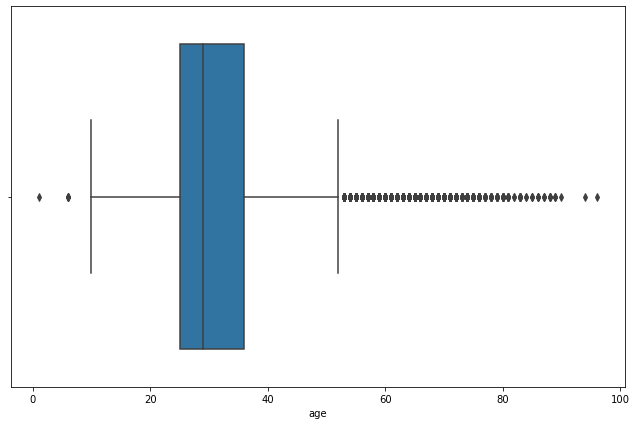

In [ ]:
plt.figure(figsize=(11,7))
sns.boxplot(x=gender_age_df['age'])
plt.show()

#### Verify age_group and age correctly mapped due to inconsistent group boundaries

In [ ]:
agegrouplist=df['group'].value_counts().index.to_list()
agegrouplist

['M32-38',
 'M23-26',
 'M22-',
 'M39+',
 'M29-31',
 'F23-',
 'F33-42',
 'M27-28',
 'F29-32',
 'F24-26',
 'F43+',
 'F27-28']

In [ ]:
df.columns

Index(['event_id', 'device_id', 'timestamp', 'longitude', 'latitude', 'city',
       'state', 'gender', 'age', 'group', 'phone_brand', 'device_model',
       'brand_eng', 'model_eng'],
      dtype='object')

In [ ]:
for i in agegrouplist:
    print(i)
    print(df[df['group']==i]['age'].value_counts())


M32-38
32.00000    7908
34.00000    7376
33.00000    4740
36.00000    3723
35.00000    3589
37.00000    2918
38.00000    2532
Name: age, dtype: int64
M23-26
25.00000    8557
26.00000    8521
24.00000    7838
23.00000    7041
Name: age, dtype: int64
M22-
22.00000    7650
21.00000    6865
20.00000    5586
19.00000    4832
18.00000    2754
17.00000    1059
16.00000     131
15.00000      88
10.00000      82
14.00000      76
6.00000       70
12.00000       2
Name: age, dtype: int64
M39+
44.00000    3090
41.00000    2424
39.00000    2336
47.00000    2281
46.00000    2017
42.00000    1783
43.00000    1647
40.00000    1622
45.00000    1334
48.00000    1307
50.00000    1036
49.00000     736
52.00000     670
53.00000     616
56.00000     438
72.00000     412
68.00000     411
57.00000     383
55.00000     353
59.00000     343
61.00000     315
51.00000     280
75.00000     220
60.00000     192
62.00000     149
71.00000     133
54.00000     123
64.00000     113
90.00000      97
67.00000      52
58.

#### Observations:

1. Based on the above query we noticed that, **group** and **age** are correctly mapped 
2. **Age** column is in float datatype. Need to convert it into **int** dataype as in original dataframe: gender_age_df
3. Need to rename the **group** labels for clarity

In [ ]:
# converting the "age" column to int datatype as per original dataset
df['age']=df['age'].astype('int64')

In [ ]:
# converting the "device_id" column to int datatype as per original dataset
df['device_id']=df['device_id'].astype('int64')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 261097 entries, 0 to 261096
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype   
---  ------        --------------   -----   
 0   event_id      261097 non-null  float64 
 1   device_id     261097 non-null  int64   
 2   timestamp     261097 non-null  object  
 3   longitude     261097 non-null  float64 
 4   latitude      261097 non-null  float64 
 5   city          261097 non-null  object  
 6   state         261097 non-null  object  
 7   gender        261097 non-null  object  
 8   age           261097 non-null  int64   
 9   group         261097 non-null  category
 10  phone_brand   261097 non-null  object  
 11  device_model  261097 non-null  object  
 12  brand_eng     261097 non-null  object  
 13  model_eng     261097 non-null  object  
dtypes: category(1), float64(3), int64(2), object(8)
memory usage: 36.2+ MB


In [ ]:
df['group'].unique()

array(['M27-28', 'M23-26', 'F27-28', 'F33-42', 'M32-38', 'M39+', 'F23-',
       'F43+', 'M29-31', 'F29-32', 'M22-', 'F24-26'], dtype=object)

In [ ]:
# converting the datatype of the 'group' column to rename the age labels

df['group'] = df['group'].astype('category')
df['group'] = df['group'].cat.rename_categories({'M22-':'M6-22','M23-26':'M23-26', 'M27-28':'M27-28', 'M29-31':'M29-31', 'M32-38': 'M32-38', 'M39+':'M39-90', 'F23-':'F11-23', 'F24-26':'F24-26', 'F27-28':'F27-28', 'F29-32':'F29-32', 'F33-42':'F33-42','F43+':'F43-78'})


# Data Post-processing

In [ ]:
profile = ProfileReport(df = df)
profile.to_file('Post Profiling Report.html')
print('Accomplished!')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Accomplished!


#### While doing analysis, we shall consider only one instance of a particular User(device_id) as a User can do multiple phone calls and considering every instance of the same User can give misleading numbers.

In [ ]:
final_df= df.drop_duplicates(subset='device_id')
final_df.shape

(4297, 14)

# Exploratory Data Analysis

 #### 1. Distribution of Users(device_id) across States.

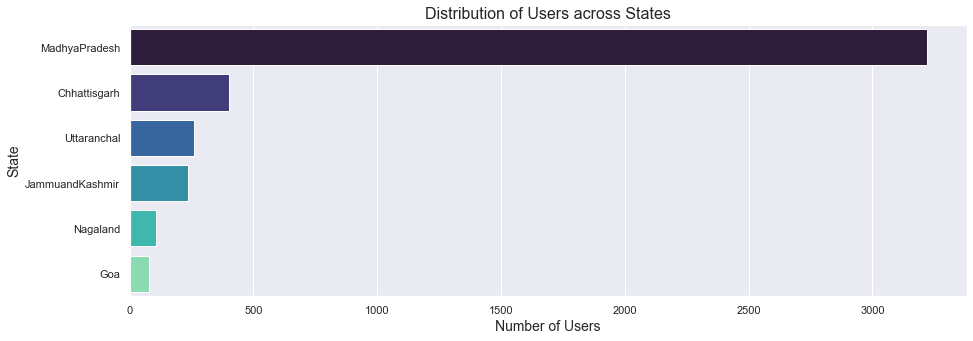

In [ ]:
#creating the plot canvas
plt.figure(figsize=[15,5])
sns.set_style('darkgrid')

#plotting the countplot
sns.countplot(y='state', data=final_df, order = final_df['state'].value_counts().index, palette='mako', saturation =1)

#setting up the axes labels
plt.xlabel(xlabel= 'Number of Users', size=14)
plt.ylabel(ylabel='State', size= 14)

#adjusting the fontscale
sns.set(font_scale = 1)

plt.title(label='Distribution of Users across States', size=16)

plt.show()

#### 2. Distribution of Users across Phone Brands(Consider only 10 Most used Phone Brands).

In [ ]:
final_df['brand_eng'].value_counts().iloc[:10].index

Index(['Xiaomi', 'Samsung', 'Huawei', 'vivo', 'OPPO', 'Meizu', 'Coolpad',
       'HTC', 'Lenovo', 'Nubia'],
      dtype='object')

In [ ]:
final_df['brand_eng'].value_counts().iloc[:10]

Xiaomi     1038
Samsung    1030
Huawei      699
vivo        410
OPPO        289
Meizu       269
Coolpad     196
HTC          61
Lenovo       52
Nubia        32
Name: brand_eng, dtype: int64

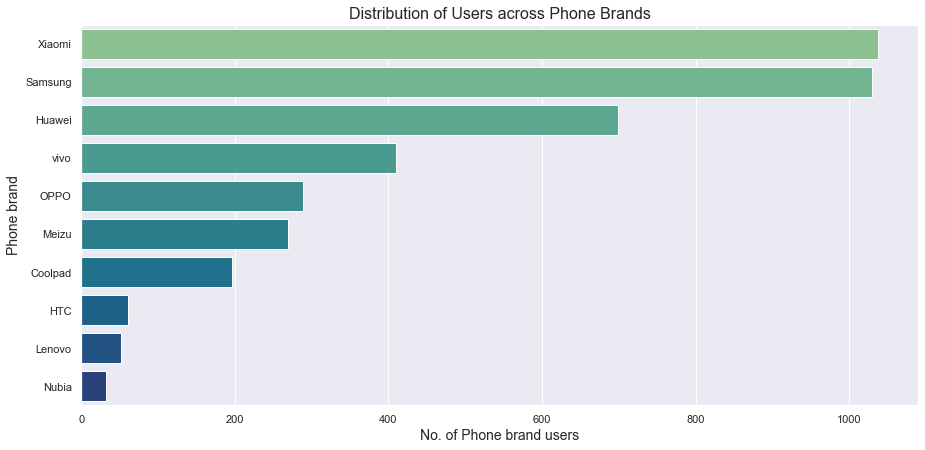

In [ ]:
plt.figure(figsize=[15,7])

sns.set_style('darkgrid')
sns.countplot(y='brand_eng', data=final_df, order=final_df['brand_eng'].value_counts().iloc[:10].index,palette='crest', saturation =1)

plt.xlabel(xlabel='No. of Phone brand users', fontsize=14)
plt.ylabel(ylabel='Phone brand', fontsize=14)

#adjusting the fontscale
sns.set(font_scale = 1)

plt.title(label='Distribution of Users across Phone Brands', size=16)

plt.show()

#### 3. Distribution of Users across Gender

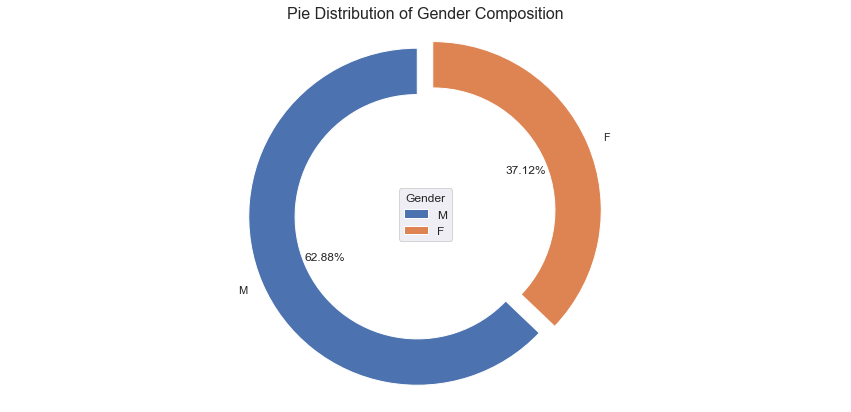

In [ ]:
plt.figure(figsize=[15,7])

explode_list = np.ones(len(final_df['gender'].unique()))/10

plt.pie(x=final_df['gender'].value_counts().values, labels=final_df['gender'].value_counts().index.to_list(),radius=2, autopct='%0.2f%%', startangle=90, explode=explode_list, wedgeprops=dict(width=0.55))

plt.axis('equal')

plt.legend(labels=final_df['gender'].value_counts().index, title="Gender", loc="center", prop={'size': 12})

# Set title label of size 16.
plt.title(label='Pie Distribution of Gender Composition', size=16)

# Display the output
plt.show()

#### 4. Distribution of Users across Age Segments

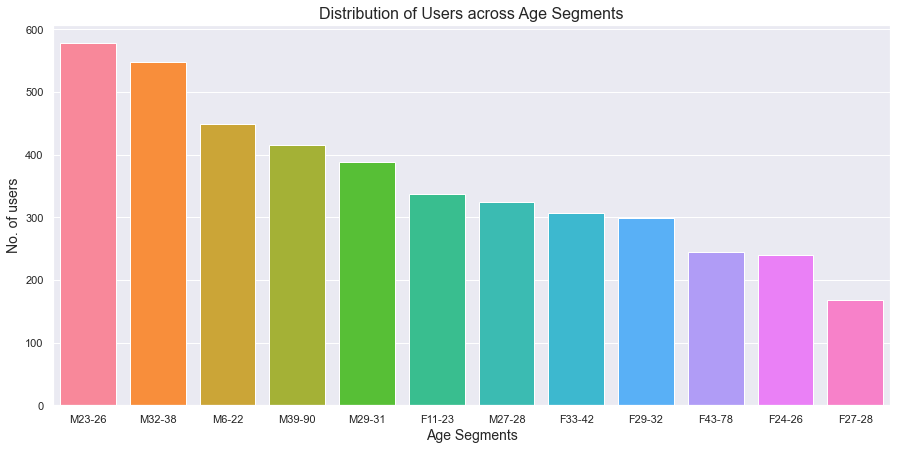

In [ ]:
plt.figure(figsize=[15,7])

sns.set_style('darkgrid')

sns.countplot(x='group', data=final_df, saturation=1, order=final_df['group'].value_counts().index)

plt.xlabel(xlabel='Age Segments', fontsize=14)
plt.ylabel(ylabel='No. of Users', fontsize=14)

#adjusting the fontscale
sns.set(font_scale = 1)

plt.title(label='Distribution of Users across Age Segments', size=16)

plt.show()

#### 5. Distribution of Phone Brands(Top 10 Most used Phone Brands) for each Age Segment, State, Gender